# **TP 3 : Filtrage spatial (Opérations locales)**

**Nom & Prénom** :

*  Imad Anis KHEFFACHE



**Spécialité** :  Data Science & Intelligence Artificielle

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import cmath

##**Manipulation 01** : Réduction de bruit


I. Lecture & affichage de l'image Isabelle


(512, 512)
uint8


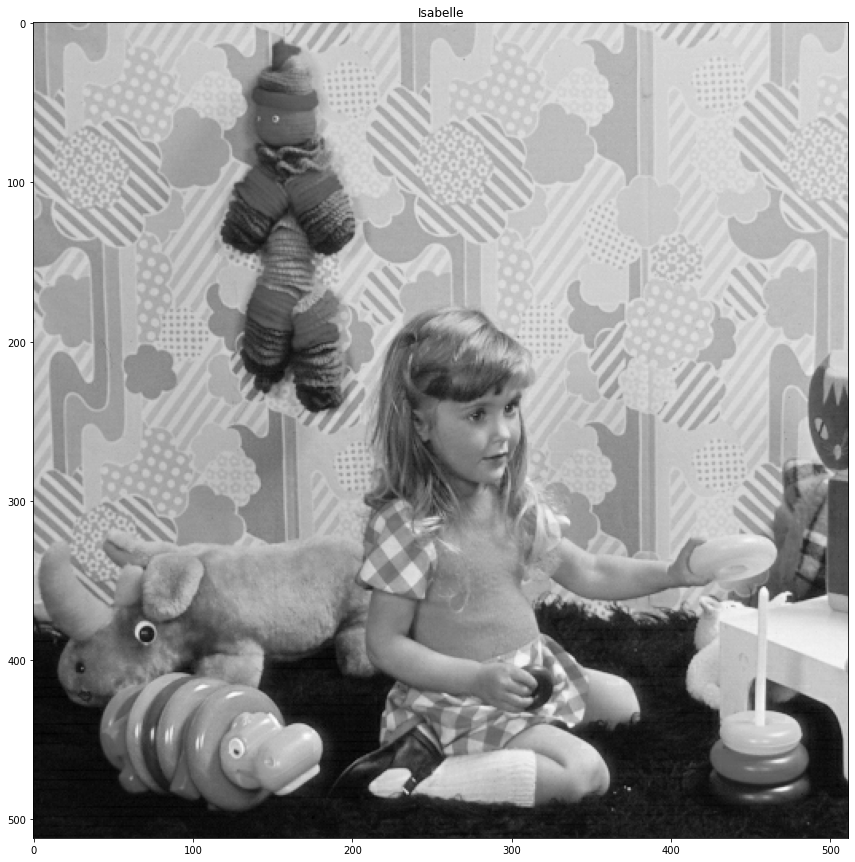

In [ ]:
plt.figure(figsize=(15, 15))     #Régler la dimension de l'image affichée

image=cv.imread('isabelle.bmp',0)
plt.title("Isabelle")
print(image.shape)
print(image.dtype)      #Type du codage utilisée dans l'image
plt.imshow(image,cmap="gray")

II. Rajout d'un bruit gaussien & affichage de l'image


Text(0.5, 1.0, 'Image bruitée')

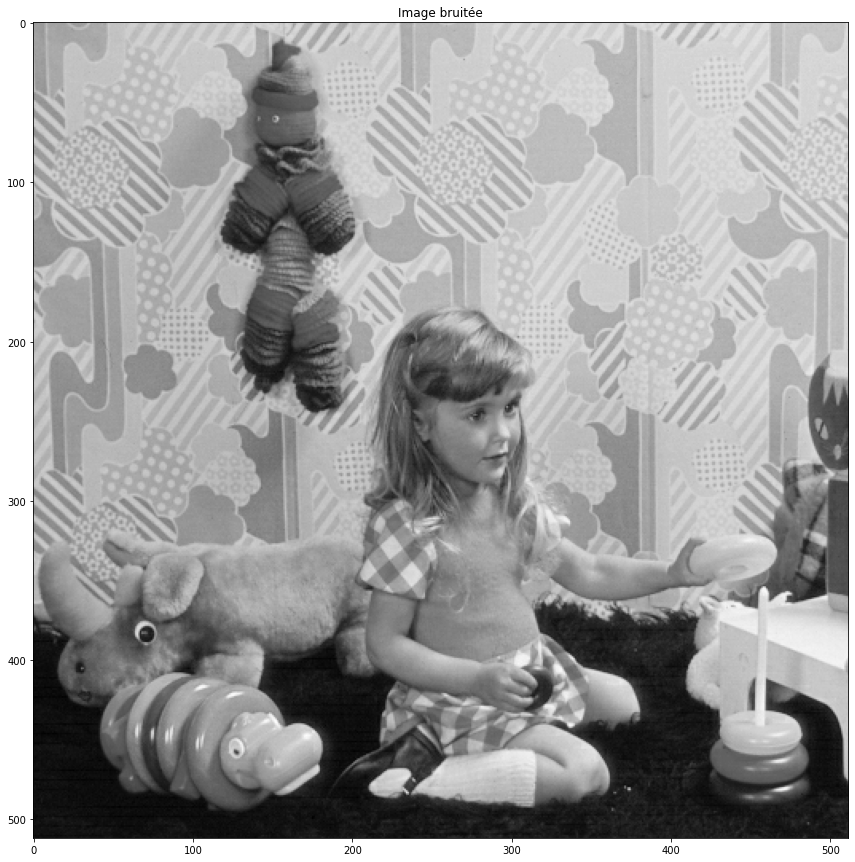

In [ ]:
plt.figure(figsize=(15, 15))    #Pour avoir un affichage facile à appréhender visuellement

#Création du bruit Gaussien
def BruitGaussien(image, mu, sigma):
    row,col=image.shape
    gauss=np.random.normal(mu,sigma,(row,col))
    bruitée=image+gauss     #Ajout additionnel du bruit aux pixels de l'image
    return bruitée

bruitée=BruitGaussien(image,0,0.1)         #Pour voir l'effet des différents bruits il faut faire varier sigma; l'écart-type du bruit
bruitée=np.uint8(bruitée)        #Codage en unsigned integers sur 8 bits de l'image
plt.imshow(bruitée, cmap="gray")     #Affichage de l'image
plt.title('Image bruitée')

**A. Filtre Moyenneur**

(512, 512)
(512, 512)
(512, 512)
(512, 512)


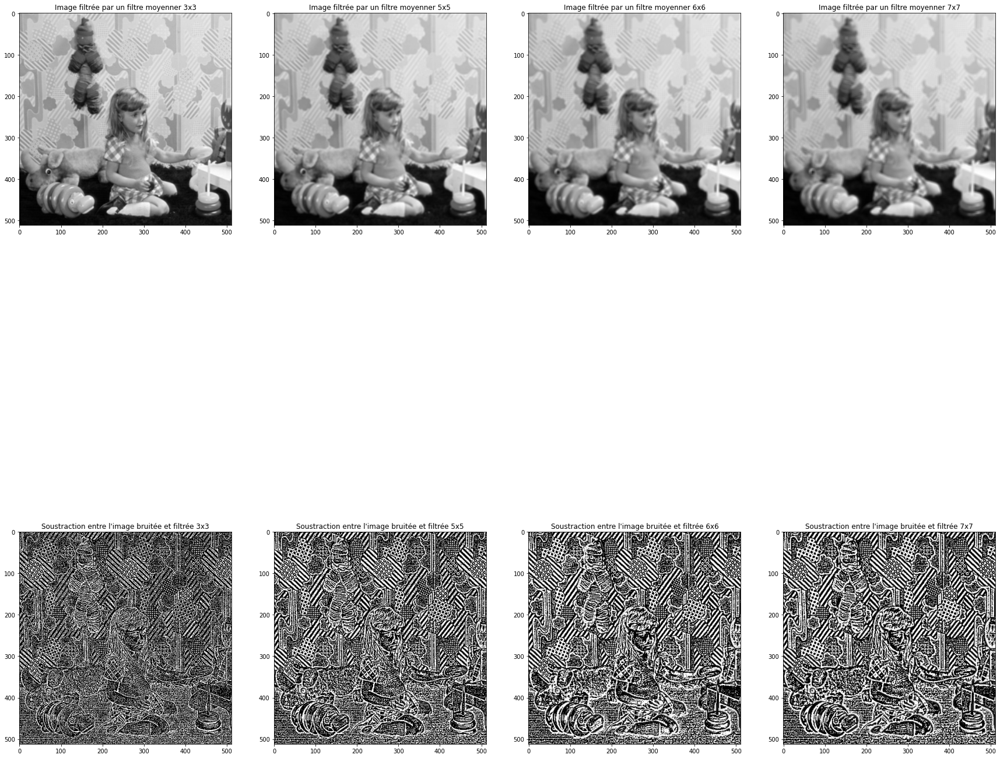

In [ ]:
#1ère partie

plt.figure(figsize=(30, 30))

#Filtre moyenneur 3x3
fil_moy_3x3=cv.blur(bruitée, (3, 3)).astype(np.uint8)
plt.subplot(2,4,1)
plt.title("Image filtrée par un filtre moyenner 3x3")
plt.imshow(fil_moy_3x3, cmap="gray")
print(fil_moy_3x3.shape)       #Affichage des dimensions de l'Image filtrée

diff1=image-fil_moy_3x3        #Soustraction entre les images bruitée et filtrée
plt.subplot(2,4,5)
plt.title("Soustraction entre l'image bruitée et filtrée 3x3")
plt.imshow(diff1, cmap="gray")



#Filtre moyenneur 5x5
fil_moy_5x5= cv.blur(bruitée, (5, 5)).astype(np.uint8)
plt.subplot(2,4,2)
plt.title("Image filtrée par un filtre moyenner 5x5")
plt.imshow(fil_moy_5x5, cmap="gray")
print(fil_moy_5x5.shape)

diff2=image-fil_moy_5x5      #Soustraction entre les images bruitée et filtrée
plt.subplot(2,4,6)
plt.title("Soustraction entre l'image bruitée et filtrée 5x5")
plt.imshow(diff2, cmap="gray")



#Filtre moyenneur 6x6
fil_moy_6x6= cv.blur(bruitée, (6, 6)).astype(np.uint8)
plt.subplot(2,4,3)
plt.title("Image filtrée par un filtre moyenner 6x6")
plt.imshow(fil_moy_6x6, cmap="gray")
print(fil_moy_6x6.shape)

diff3=image-fil_moy_6x6
plt.subplot(2,4,7)
plt.title("Soustraction entre l'image bruitée et filtrée 6x6")
plt.imshow(diff3, cmap="gray")




#Filtre moyenneur 7x7
fil_moy_7x7= cv.blur(bruitée, (7, 7)).astype(np.uint8)
plt.subplot(2,4,4)
plt.title("Image filtrée par un filtre moyenner 7x7")
plt.imshow(fil_moy_7x7, cmap="gray")
print(fil_moy_7x7.shape)

diff4=image-fil_moy_7x7
plt.subplot(2,4,8)
plt.title("Soustraction entre l'image bruitée et filtrée 7x7")
plt.imshow(diff4, cmap="gray")

Commentaires :

- On remarque que les 4 masques ont réduit le bruit gaussien mais ils ont rajouté du flou à des degrés différents : plus on augmente la taille du filtre, plus l'image devient floue, plus on perd les détails.



- Taille des image filtrées obtenues : (512,512) , restées la même, ce qui est logique car on a pas effectué une réduction de volume (ni un redimensionnement) sur l'image originale, mais plutôt une réduction de bruit; il est aussi à noter qu'un padding a été entrepris pour ne pas réduire la taille de l'image (pour les pixels du bord).

- Les bornes ont été traitées par défaut par (borderType = BORDER_DEFAULT), c'est une méthode qui rajoute du padding à l'extérieur de l'image en considérant le pixel traité comme point de réflexion "1 |1 2 3 5| 3". Cependant la façon dont on traite les bords (c'est à dire le padding) son rôle peut-être significativement négligeable sauf dans le cas ou la taille du filtre est importante, mais dans notre cas son importance peut-être largement négligée.


La soustraction entre l'image originale et les images filtrées montre qu'il y a une différence entre elles. Il y a des détails manquants sur les images filtrées par rapport à l'image originale à des degrés différents (déduit du fait que la soustraction ne donne pas une image toute noire (c'est le cas idéal)), ce qui est logique car on avait déjà dit que plus on augmente la taille du filtre, plus l'image devient floue, plus on perd les détails de l'image: puisque le filtre moyenneur calcule une moyenne qui affecte le même poids à tous les pixels voisins ce qui diminue considérablement l'importance du pixel central qui est le pixel concerné et donc d'autant plus que le masque est grand d'autant plus que le pixel aura moins d'importance et donc il sera lissé dans son entourage et donc l'image résultante sera d'autant plus floue.
donc:
- On remarque qu'en augmentant la taille du filtre, l'image résultante de la soustraction fait apparaître de plus en plus les contours (sa luminance augmente, ce qui est indésirable pour une réduction de bruit), ce qui explique la disparition des contours au fur et à mesure qu'on augmente la taille du filtre (disparition des détails de l'image, ils ont été lissés et donc détectés lors de la soustraction).
- On remarque aussi que le floutage augmente au fur et à mesure qu'on augmente la taille du filtre; il y a une relation proportionnelle entre les deux.






**Conclusion :**

Les filtres appliqués sont des filtres moyenneurs pour la réduction de bruit. Ce sont des filtres passe-bas effectuant un lissage sur l'image bruitée en faisant une moyenne dans un voisinage 3x3 , 5x5 , 6x6 et 7x7 respectivement (matrices de convolution avec tous les coefficients identiques et leur somme qui vaut 1 et la matrice divisée par le nombre de pixels dans le filtre et ce pour ne pas modifier la luminance globale de l'image après filtrage).
Plus on augmente la taille du filtre moyenneur plus l'image filtrée est floue, plus on perd les détails de l'image (lissage). Donc le filtre moyenneur n'est pas un filtrage robuste, ses inconvénients ne compensent pas ses avantages (sauf cas extrêmes). Le filtre moyenneur qui a donné le meilleur résultat est le filtre **3x3**.

**B. Filtre Gaussien**

Text(0.5, 1.0, 'Filtrage Gaussien 3x3')

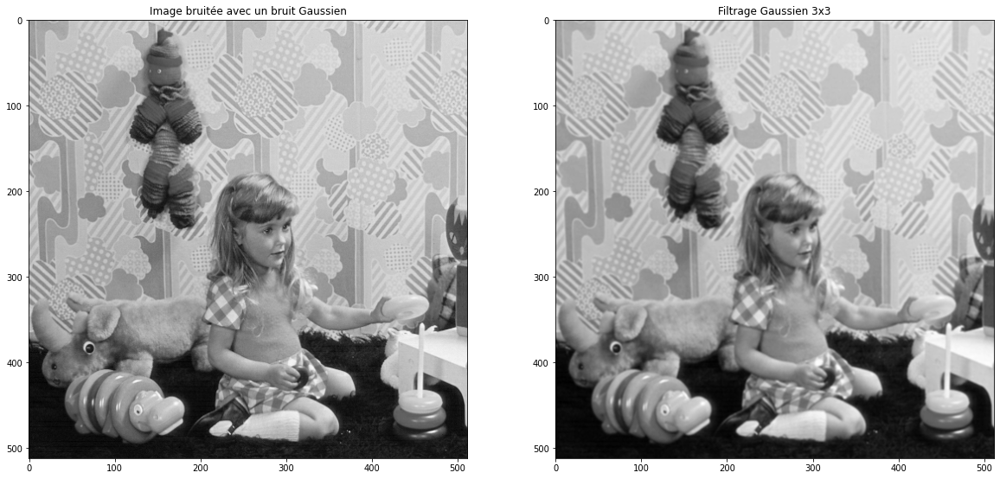

In [ ]:
#1. Filtrage gaussien 3x3, écart-type unitaire

plt.figure(figsize=(20, 20))     #Toujours modifier la taille de la visualisation

gaussien_3x3=cv.GaussianBlur(bruitée, (3, 3), 1)
plt.subplot(1,2,1)
plt.imshow(bruitée.astype(np.uint8), cmap="gray")
plt.title("Image bruitée avec un bruit Gaussien")
plt.subplot(1,2,2)
plt.imshow(gaussien_3x3.astype(np.uint8), cmap="gray")
plt.title("Filtrage Gaussien 3x3")


Commentaire :
* On remarque que le filtre gaussien a enlevé plus ou moins efficacement le bruit tout en rajoutant du flou par rapport mais ce flou est moindre par rapport au filtre moyenneur.

2. Etude de l’influence de la taille du filtre et de la valeur de l’écart-type σ :



Text(0.5, 1.0, 'Filtrage Gaussien 3x3 et sigma=10')

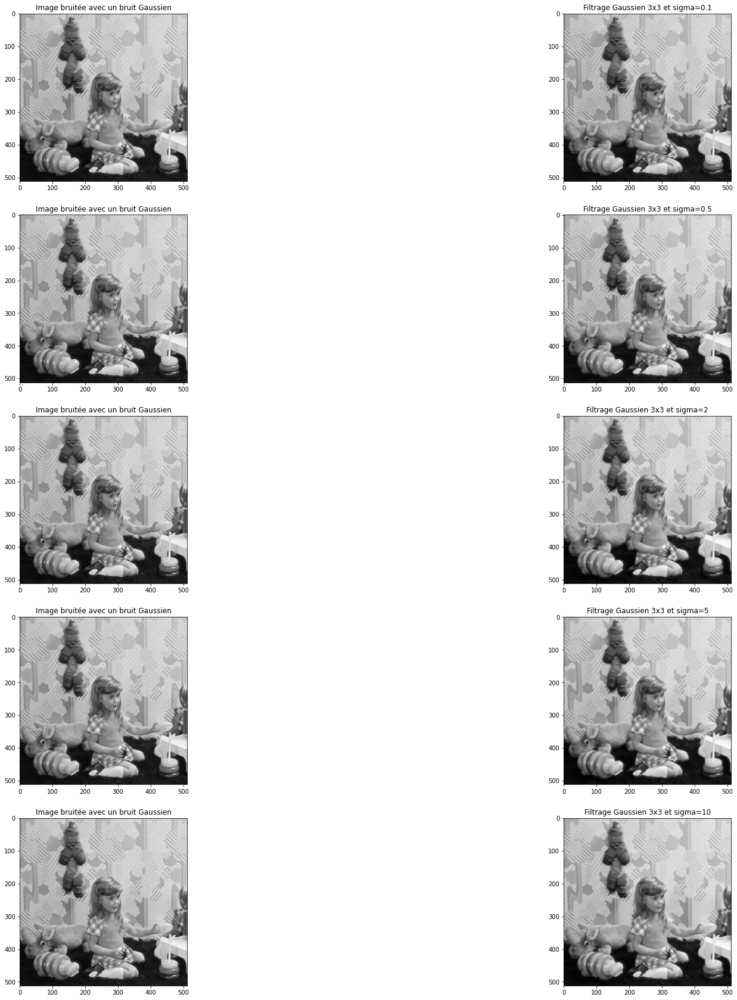

In [ ]:
#Effet de la variation de l'écart-type
# On fait varier un seul paramètre du filtre en fixant tous les autres pour connaître son véritabe effet sur les résultats obtenus
# de même pour la variation de la taille

plt.figure(figsize=(30, 30))     #Toujours modifier la taille de la visualisation

gaussien_3x3_sig10_1=cv.GaussianBlur(bruitée, (3, 3), 0.1)
plt.subplot(5,2,1)
plt.imshow(bruitée.astype(np.uint8), cmap="gray")
plt.title("Image bruitée avec un bruit Gaussien")
plt.subplot(5,2,2)
plt.imshow(gaussien_3x3_sig10_1.astype(np.uint8), cmap="gray")
plt.title("Filtrage Gaussien 3x3 et sigma=0.1")


gaussien_3x3_sig5_10_1=cv.GaussianBlur(bruitée, (3, 3), 0.5)
plt.subplot(5,2,3)
plt.imshow(bruitée.astype(np.uint8), cmap="gray")
plt.title("Image bruitée avec un bruit Gaussien")
plt.subplot(5,2,4)
plt.imshow(gaussien_3x3_sig5_10_1.astype(np.uint8), cmap="gray")
plt.title("Filtrage Gaussien 3x3 et sigma=0.5")


gaussien_3x3_sig2=cv.GaussianBlur(bruitée, (3, 3), 2)
plt.subplot(5,2,5)
plt.imshow(bruitée.astype(np.uint8), cmap="gray")
plt.title("Image bruitée avec un bruit Gaussien")
plt.subplot(5,2,6)
plt.imshow(gaussien_3x3_sig2.astype(np.uint8), cmap="gray")
plt.title("Filtrage Gaussien 3x3 et sigma=2")


gaussien_3x3_sig5=cv.GaussianBlur(bruitée, (3, 3), 5)
plt.subplot(5,2,7)
plt.imshow(bruitée.astype(np.uint8), cmap="gray")
plt.title("Image bruitée avec un bruit Gaussien")
plt.subplot(5,2,8)
plt.imshow(gaussien_3x3_sig5.astype(np.uint8), cmap="gray")
plt.title("Filtrage Gaussien 3x3 et sigma=5")


gaussien_3x3_sig10=cv.GaussianBlur(bruitée, (3, 3), 10)
plt.subplot(5,2,9)
plt.imshow(bruitée.astype(np.uint8), cmap="gray")
plt.title("Image bruitée avec un bruit Gaussien")
plt.subplot(5,2,10)
plt.imshow(gaussien_3x3_sig10.astype(np.uint8), cmap="gray")
plt.title("Filtrage Gaussien 3x3 et sigma=10")

**Commentaire:**


*  On remarque qu'avec l'augmentation de l'écart-type le flou dans l'image augmente aussi (légèrement mais une augmentation quand même); il y a une relation proportionnelle entre les deux.



Text(0.5, 1.0, 'Filtrage Gaussien 21x21')

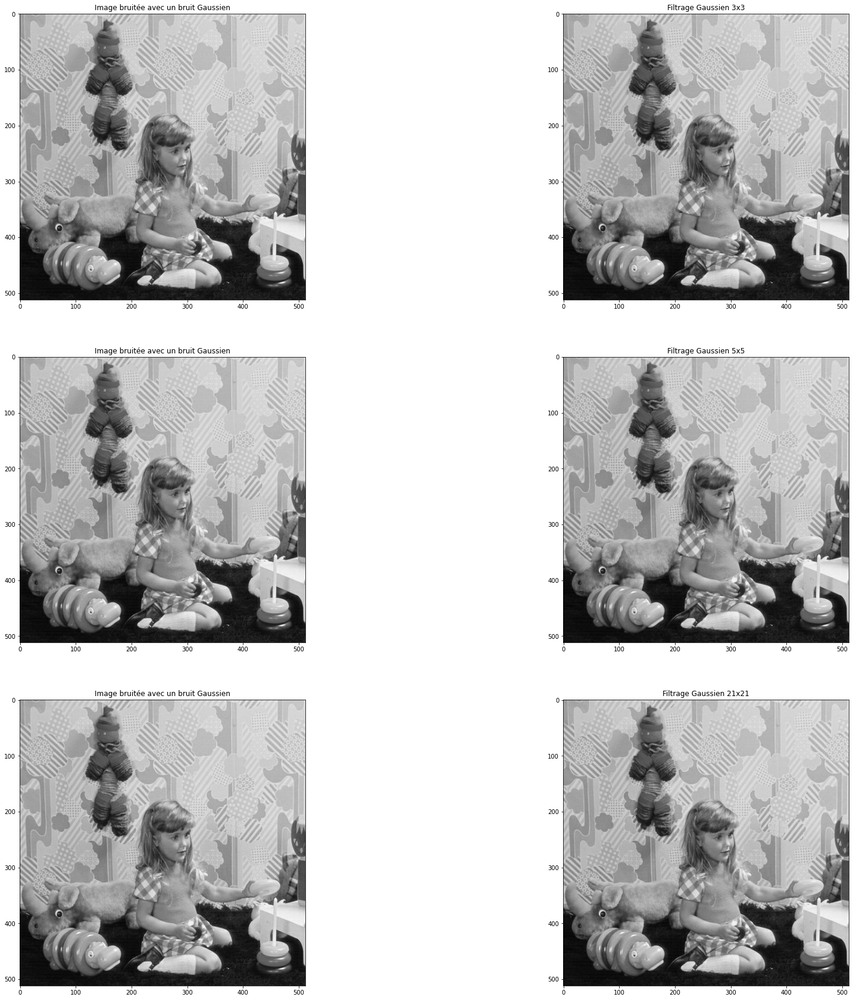

In [ ]:
# Effet de la variation de la taille du masque
# Taille par défaut de l'écart-type (sigma=0.1), pour minimiser les dégâts et voir véritablement l'effet de la taille du filtre


plt.figure(figsize=(30, 30))

gaussien_3x3=cv.GaussianBlur(bruitée, (3, 3), 0.1)
plt.subplot(3,2,1)
plt.imshow(bruitée.astype(np.uint8), cmap="gray")
plt.title("Image bruitée avec un bruit Gaussien")
plt.subplot(3,2,2)
plt.imshow(gaussien_3x3.astype(np.uint8), cmap="gray")
plt.title("Filtrage Gaussien 3x3")


gaussien_5x5=cv.GaussianBlur(bruitée, (5, 5), 0.1)
plt.subplot(3,2,3)
plt.imshow(bruitée.astype(np.uint8), cmap="gray")
plt.title("Image bruitée avec un bruit Gaussien")
plt.subplot(3,2,4)
plt.imshow(gaussien_5x5.astype(np.uint8), cmap="gray")
plt.title("Filtrage Gaussien 5x5")



gaussien_21x21=cv.GaussianBlur(bruitée, (21, 21), 0.1)
plt.subplot(3,2,5)
plt.imshow(bruitée.astype(np.uint8), cmap="gray")
plt.title("Image bruitée avec un bruit Gaussien")
plt.subplot(3,2,6)
plt.imshow(gaussien_21x21.astype(np.uint8), cmap="gray")
plt.title("Filtrage Gaussien 21x21")

**Commentaires:**

*  On remarque qu'à chaque changement de taille du masque, le flou dans les images ne change presque pas; il est à noter que le degré de lissage est fortement lié à l'écart type 𝜎, plus on augmente l’écart-type σ plus on rajoute du floue à l'image filtrée. Mais on doit agrandir le filtre pour chaque augmentation de 𝜎, puisque tout les éléments du filtre doivent se sommer à 1 pour ne pas modifier la luminance globale de l'image. A chaque fois on augmente ou diminue sigma, le nombre de cases pour avoir une somme égale à 1 varie. Il faut donc les changer proportionnellement.</br>
Donc enfin, l'écart-type c'est la quantité qui influence le plus la qualité du filtrage beaucoup plus que la taille du filtre dont l'influence est minime; il faut juste que l'augmentation de sigma s'accompagne par une augmentation de la taille pour garder la luminance globale de l'image non-touchée. Le critère à considérer toujours c'est l'écart-type.

3) Le masque qui me semble meilleur est de dimension **3x3** avec écart-type de **0.1**, car ces 2 valeurs vérifient plus ou moins l'efficaité de la relation entre sigma et la taille du masque qui doit être idéalement égale à la partie entière supérieure de ((6*sigma+1)^2). On peut retrouver ce même résultat à travers les soustractions (la soustraction qui soit la plus proche possible de l'image noire).

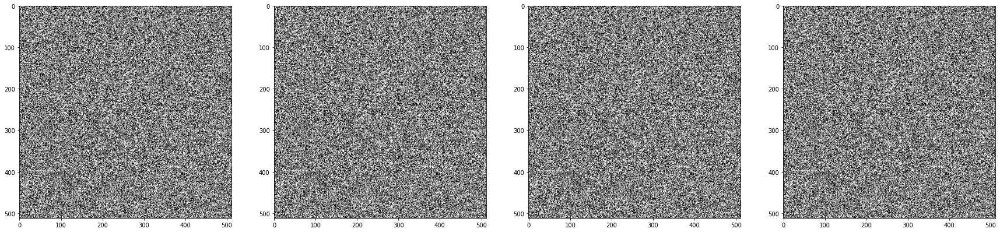

In [ ]:
fig=plt.figure(figsize=(30, 30))

# Soustraction entre l’image originale et l’image filtrée (3x3, sigma=0.1)
img_st=(image-cv.GaussianBlur(bruitée, (3, 3), 0.1)).astype('uint8')
plt.subplot(1,4,1)
plt.imshow(img_st, cmap="gray")

S1=[gaussien_3x3, gaussien_5x5, gaussien_21x21]
for i,img in enumerate(S1) :
 img_soustraite=(image-img).astype("uint8")
 plt.subplot(1,4,i+2)
 plt.imshow(img_soustraite, cmap="gray")

**Commentaire:**  </br>
On remarque sur les différentes soustractions que le filtre avec une taille de **3x3** et un écart-type égal à **0.1** est celle la plus proche d'une image noire (c'est celle qui contient le plus de points noirs si on observe bien); et donc ça confirme notre choix que dans les filtres gaussiens que plus petit l'écart-type est et plus la taille du filtre suit ce dernier, le filtre sera d'autant plus efficace.

**C. Filtre Médian**

Text(0.5, 1.0, "Soustraction entre l'image originale et flitrée")

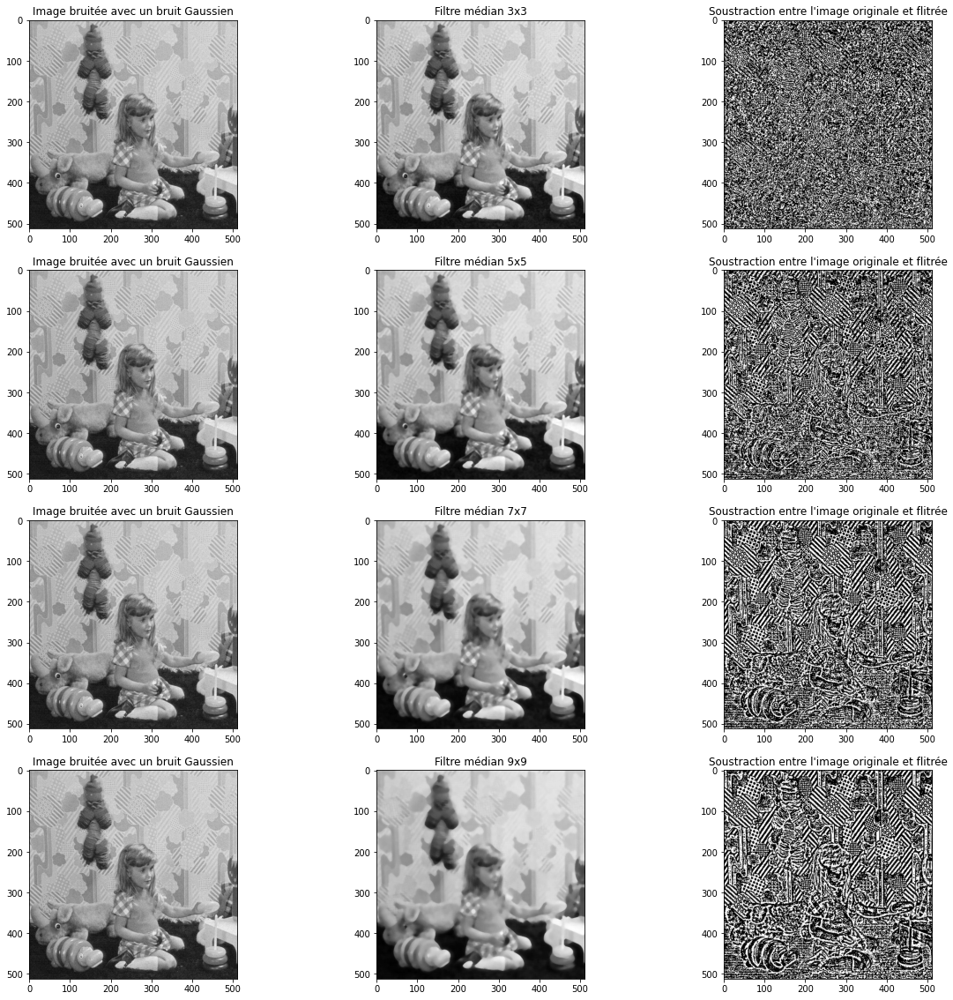

In [ ]:
#1.

# 3x3
plt.figure(figsize=(20, 20))
bruitée=bruitée.astype('uint8')     #Codage des pixels sur des entiers en 8 bits non signés

fil_med_3=cv.medianBlur(bruitée, 3)
plt.subplot(4,3,1)
plt.imshow(bruitée.astype(np.uint8), cmap="gray")
plt.title("Image bruitée avec un bruit Gaussien")
plt.subplot(4,3,2)
plt.title("Filtre médian 3x3")
plt.imshow(fil_med_3, cmap="gray")
img_soustraite_3=(image-fil_med_3).astype("uint8")
plt.subplot(4,3,3)
plt.imshow(img_soustraite_3, cmap="gray")
plt.title('Soustraction entre l\'image originale et flitrée')





# 5x5
fil_med_5=cv.medianBlur(bruitée, 5)
plt.subplot(4,3,4)
plt.imshow(bruitée.astype(np.uint8), cmap="gray")
plt.title("Image bruitée avec un bruit Gaussien")
plt.subplot(4,3,5)
plt.title("Filtre médian 5x5")
plt.imshow(fil_med_5, cmap="gray")
img_soustraite_5=(image-fil_med_5).astype("uint8")
plt.subplot(4,3,6)
plt.imshow(img_soustraite_5, cmap="gray")
plt.title('Soustraction entre l\'image originale et flitrée')





# 7x7
fil_med_7=cv.medianBlur(bruitée, 7)
plt.subplot(4,3,7)
plt.imshow(bruitée.astype(np.uint8), cmap="gray")
plt.title("Image bruitée avec un bruit Gaussien")
plt.subplot(4,3,8)
plt.title("Filtre médian 7x7")
plt.imshow(fil_med_7, cmap="gray")
img_soustraite_7=(image-fil_med_7).astype("uint8")
plt.subplot(4,3,9)
plt.imshow(img_soustraite_7, cmap="gray")
plt.title('Soustraction entre l\'image originale et flitrée')





# 9x9
fil_med_9=cv.medianBlur(bruitée, 9)
plt.subplot(4,3,10)
plt.imshow(bruitée.astype(np.uint8), cmap="gray")
plt.title("Image bruitée avec un bruit Gaussien")
plt.subplot(4,3,11)
plt.title("Filtre médian 9x9")
plt.imshow(fil_med_9, cmap="gray")
img_soustraite_9=(image-fil_med_9).astype("uint8")
plt.subplot(4,3,12)
plt.imshow(img_soustraite_9, cmap="gray")
plt.title('Soustraction entre l\'image originale et flitrée')

Comparaison & conclusion :


* Avec les différentes tailles du masque, on obtient plusieurs soustractions; la plus efficace c'est évidemment celle dont la soustraction se rapproche le plus à une image noire; dans notre cas c'est la taille du masque **3x3** qui correspond à ce critère.

* Le filtre est efficace contre le bruit (pour les petites tailles de masque), il n'introduit pas ou très peu de lissage, il fait juste remplacer la valeur du pixel par la valeur médiane dans le masque; mais si la taille du masque du filtre est grande, plusieurs pixels qui ont de moins en moins de relation de voisinage avec le pixel qu'on veut filtrer influencent sur sa valeur en faisant basculer la médiane, ce qui fait donc perdre de l'information locale, ce qui justifie donc le floutage qui augmente proportionnellement avec la taille du masque.

* Le filtrage médian fait un bon travail lors de son utilisation pour réduire un bruit Gaussien additif avec des voisinages plus ou moins petits.</br>
Pour le filtre de taille 3x3, la soustraction est la plus proche d'une image noire ce qui veut dire c'est le filtre qui floute le moins l'image.</br></br>
Comme critère de séléction d'un filtre médian, c'est sa taille qui doit être relativement petite pour minimiser le floutage.




III. Comparaison des 3 filtres :

Les 3 filtres sont des filtres passe-bas pour la réduction de bruit (dans ce cas, le bruit est gaussien), ils rajoutent du flou à l'image, éliminent ses détails et effectuent aussi un lissage.

Le filtre gaussien et le filtre moyenneur sont des filtres linéaires (filtrage par convolution), tandis que le filtre médian est non-linéaire (fait
intervenir les pixels voisins suivant une loi non-linéaire).


le filtre moyenneur a réussi à réduire le bruit gaussien mais en rajoutant du floue à l'image, ce qui nous a fait perdre beaucoup de détails (élimination des contours); il donne la même importance à tous les pixels dans le masque pour construire le nouveau niveau de gris ce qui ne le mets pas suffisamment en valeur.

Le filtre gaussien réduit le bruit encore mieux tout en évitant de flouter l'image autant que le filtre moyenneur puisque le filtre Gaussien ne donne pas la même importance aux pixels voisins du pixel central, les coefficients qui lui sont attribués suivent une loi normale et donc c'est le pixel central qui a le plus d'importance et donc ça produit moins de lissage.

Bien qu'il est adapté aux bruits impulsionnels, le filtre médian a réduit aussi le bruit assez bien; il ne produit presque aucun lissage.

Après filtrage et après analyse des résultats, on remarque que le filtre gaussien est le filtre adapté au bruit gaussien.

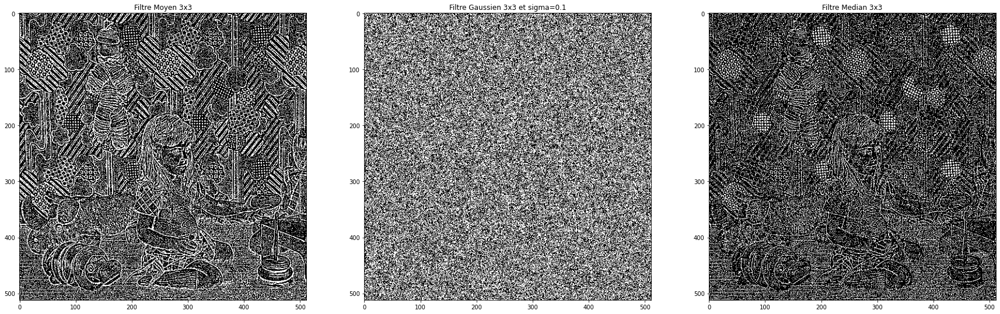

In [ ]:
# Comparaison : On choisira le meilleur filtre de chaque catégorie et on comparera entre eux pour pouvoir décider quelle catégorie donne le meilleur résultat sur
# le bruit Gaussein additif

plt.figure(figsize=(30, 30))

#Filtrage moyen 3x3
comparaison1=(image-cv.blur(bruitée, (3, 3))).astype(np.uint8)    # On choisit 3x3 car c'est le meilleur filtre moyen pour les bruits gaussiens
plt.subplot(1,3,1)
plt.title("Filtre Moyen 3x3")
plt.imshow(comparaison1, cmap="gray")

#Filtre gaussien 3x3 , σ=0.1
comparaison2=(image-cv.GaussianBlur(bruitée, (3, 3), 0.1)).astype(np.uint8)
plt.subplot(1,3,2)
plt.title("Filtre Gaussien 3x3 et sigma=0.1")
plt.imshow(comparaison2, cmap="gray")

#Filtre Médian
plt.subplot(1,3,3)
comparaison3=(image-cv.medianBlur(bruitée, 3)).astype(np.uint8)
plt.title("Filtre Median 3x3")
plt.imshow(comparaison3, cmap="gray")

* A partir du résultat des soustractions qu'on vient d'obtenir, on remarque que celle faite avec un filtre gaussien est la plus proche vers une image noire avec une distribution beaucoup plus homogène que les autres filtres (il ne laisse aucun contour dans l'image soustraction); et don comme conclusion: **Le filtre le plus adapté au bruit Gaussien additifi est le filtre GAUSSIEN qui satisfait la relation entre la taille et l'écart-type suivante ((6*sigma+1)^2)**. </br>
Le choix le plus judicieux est le filtre Gaussien.

IV. Refaire l’étude des 3 filtres pour un bruit impulsionnel de 0.1

<ipython-input-64-82a4573f9f68>:13: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords]=255
<ipython-input-64-82a4573f9f68>:19: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords]=0


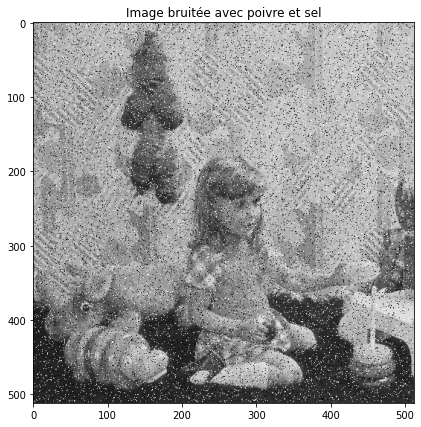

In [ ]:
plt.figure(figsize=(7, 7))

#Fonction bruit impulsionnel (Poivre et sel)

def impulse(img,amount):
    row,col=img.shape
    s_vs_p=0.5
    out=np.copy(img)
    # Salt mode
    num_salt=np.ceil(amount * img.size * s_vs_p)
    coords=[np.random.randint(0, i-1, int(num_salt))
            for i in img.shape]
    out[coords]=255

    # Pepper mode
    num_pepper=np.ceil(amount* img.size * (1. - s_vs_p))
    coords=[np.random.randint(0, i-1, int(num_pepper))
            for i in img.shape]
    out[coords]=0
    return out

#L'addition du bruit impulsionnel avec l'image originale

bruit_povsel=impulse(image, 0.1)
plt.title("Image bruitée avec poivre et sel")
plt.imshow(bruit_povsel.astype(np.uint8), cmap="gray")

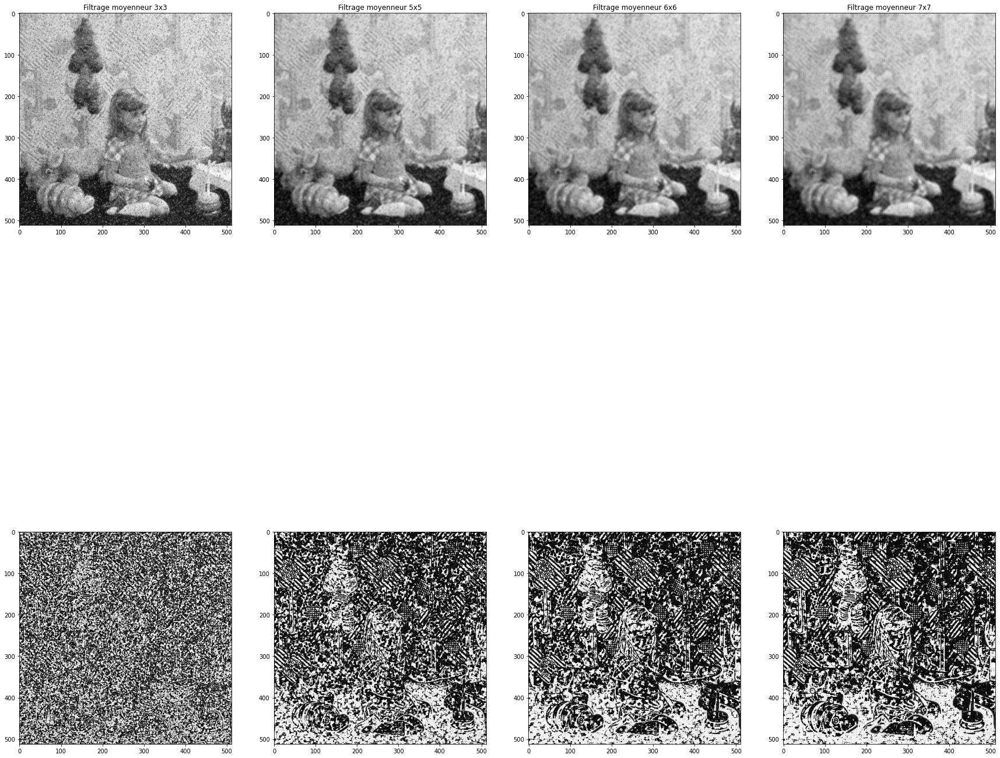

In [ ]:
plt.figure(figsize = (30, 30))

#Filtres Moyenneurs

fil_taille=[3, 5, 6, 7]
Moy=[]
for i in range(len(fil_taille)):
    plt.subplot(2, 4, i+1)
    Moy.append(cv.blur(bruit_povsel, (fil_taille[i], fil_taille[i])))
    plt.imshow(Moy[i].astype(np.uint8), cmap="gray")
    plt.title("Filtrage moyenneur " + str(fil_taille[i]) + "x" + str(fil_taille[i]))
for i in range(len(fil_taille)):
    plt.subplot(2, 4, 4+i+1)
    plt.imshow((image-Moy[i]).astype(np.uint8), cmap="gray")

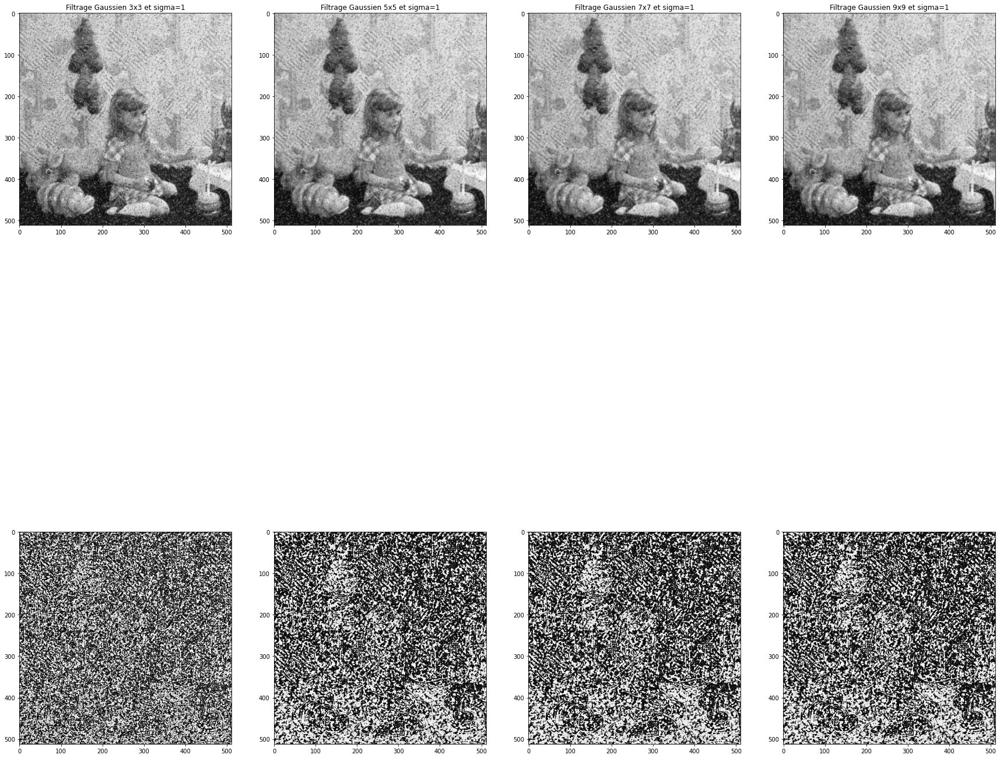

In [ ]:
plt.figure(figsize = (30, 30))

#Filtres Gaussiens

fil_taille=[3, 5, 7, 9]
Gaussien=[]
for i in range(len(fil_taille)):
    plt.subplot(2, 4, i+1)
    Gaussien.append(cv.GaussianBlur(bruit_povsel, (fil_taille[i], fil_taille[i]), 1))
    plt.imshow(Gaussien[i].astype(np.uint8), cmap="gray")
    plt.title("Filtrage Gaussien "+str(fil_taille[i])+"x"+str(fil_taille[i])+" et sigma=1")
    plt.subplot(2, 4, 4+i+1)
    plt.imshow((image-Gaussien[i]).astype(np.uint8), cmap="gray")

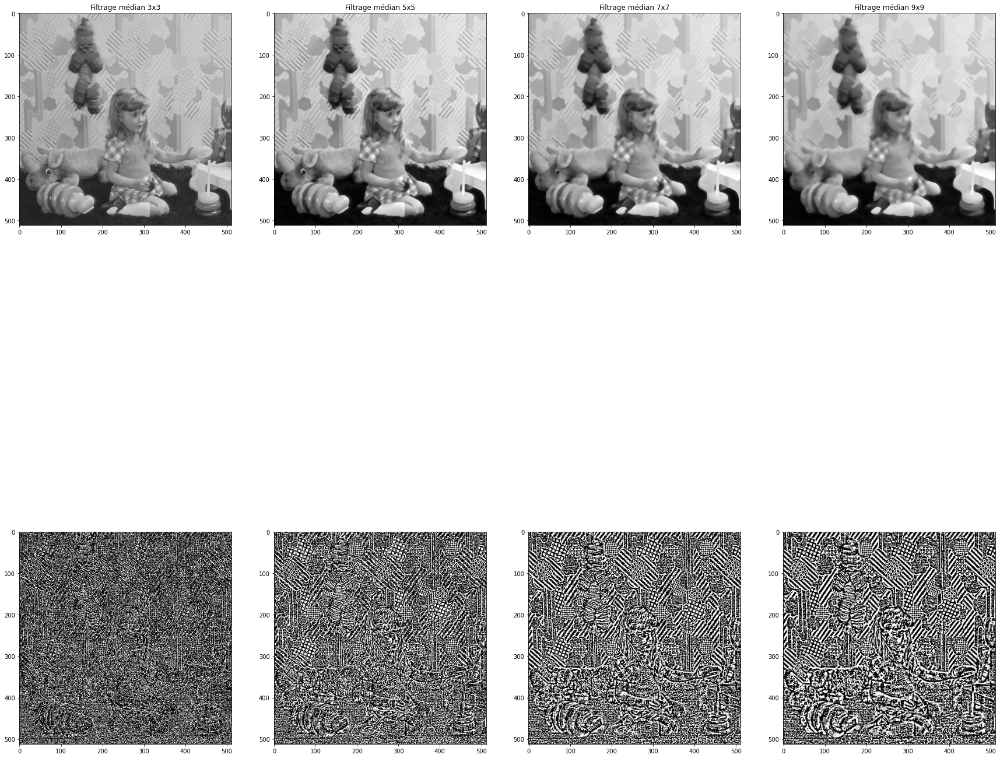

In [ ]:
#Filtres Médian

plt.figure(figsize = (30, 30))


bruit_povsel=bruit_povsel.astype(np.uint8)      #Adaptation du codage
fil_taille=[3, 5, 7, 9]
med=[]

for i in range(len(fil_taille)):
    plt.subplot(2, 4, i+1)
    med.append(cv.medianBlur(bruit_povsel, fil_taille[i], fil_taille[i]))
    plt.imshow(med[i].astype(np.uint8), cmap="gray")
    plt.title("Filtrage médian " + str(fil_taille[i]) + "x" + str(fil_taille[i]))

for i in range(len(fil_taille)):
    plt.subplot(2, 4, 4+i+1)
    plt.imshow((med[i]-image).astype(np.uint8), cmap="gray")

Comparaison entre les 3 filtres :

* Le filtre moyenneur a réduit le bruit impulsionnel mais a éliminé les contours. En augmentant la taille du filtre l'image devient floue et on perd ses détails, on remarque ceci dans la différence entre l'image originale et les images filtrées. Il y a aussi le fait que le filtre moyenneur lisse le bruit impulsionnel et le dissout dans l'image; ça rend l'image visuellement désagréable.

* Le filtre gaussien a réduit le bruit tout en évitant (au maximum) de flouter l'image, ce qui se voit dans les images représentant la différence entre l'image bruitée et l'image filtrée; mais l'image devient visuellement désagréable car le bruit impulsionnel est aussi dissout dans l'image avec un degré moindre que le moindre, ça donne l'impression d'avoir des parasytes sur l'image.

* Le filtre médian par contre a fait une très bonne réduction de bruit, il l'a nettoyé tout en préservant les contours de l'image, ce qui se voit dans les images représentant la différence entre l'image bruitée et l'image filtrée; qui donnet des images proches d'une image noire et avec une distribution homogène des niveaux de gris sur toute l'image résultante de la soustraction.

Et donc à partir de toutes les différences qu'on vient de faire on dit que le filtre le plus adapté au bruit impulsionnel est : **le filtre médian**.

V. Augmentation du pourcentage des pixels remplacés :


In [ ]:
# Choix d'utilisation d'un filtre médian 5x5

plt.figure(figsize = (150, 150))

amount=[0.1, 0.2, 0.5, 0.7, 0.9, 1]
bruit_poivresel=[]
median=[]
for i in range(len(amount)):
    plt.subplot(3, 6, i+1)
    bruit_poivresel.append(impulse(image, amount[i]))
    plt.imshow(bruit_poivresel[i].astype(np.uint8), cmap="gray")
    plt.title("Bruit impulsionnel : " + str(amount[i]))

    plt.subplot(3, 6, i+7)
    median.append(cv.medianBlur(bruit_poivresel[i], 5, 5))
    plt.imshow(median[i].astype(np.uint8), cmap="gray")
    plt.title("Masque 5x5")

    plt.subplot(3, 6, i+13)
    plt.imshow((median[i]-image).astype(np.uint8), cmap="gray")
    plt.title('Soustraction')

<ipython-input-64-82a4573f9f68>:13: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords]=255
<ipython-input-64-82a4573f9f68>:19: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords]=0


* En augmentant le pourcentage de pixels remplacés, le filtre médian pas aussi performant.
* On remarque qu'il n'est plus performant à partir de 60% de perturbations ce qui est logique, car les pixels bruités à partir de ce niveau seront dominants dans l'image; ce qui veut dire que la médiane risque plus d'être un des pixels du bruit qu'un pixel véritable de l'image, donc ça impossible de restituer tous les pixels, parce qu'à un stade élevé de bruit, la majorité du voisinage d'un pixel sont bruités donc choisir la médian s'avère mauvais.
* Pour conclure : on peut dire que le filtre médian est efficace pour le bruit impulsionnel mais a des limites qu'on peut empiriquement fixer par le biais des remarques visuelles faites dans ce TP à **0.6** ou supérieur.